<a href="https://colab.research.google.com/github/BeyzaDurdu/yolov5-fruit-vegetable-detection/blob/main/YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Yolov5 Kurulum

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # repostory'i klonluyoruz
%cd yolov5
%pip install -qr requirements.txt # gerekli kütüphaneleri install ediyoruz
%pip install -q roboflow #roboflow u install ediyoruz

import torch
import os
from IPython.display import Image, clear_output  # resimleri görüntülemek için

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})") #hangi ekran kartını kullandığımızı yazdırıyoruz


Cloning into 'yolov5'...
remote: Enumerating objects: 17265, done.
remote: Total 17265 (delta 0), reused 0 (delta 0), pack-reused 17265 (from 1)
Receiving objects: 100% (17265/17265), 16.09 MiB | 11.01 MiB/s, done.
Resolving deltas: 100% (11855/11855), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 913.6/913.6 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 14.6 MB/s eta 0:00:00
Setup complete. Using torch 2.5.1+cu121 (CPU)


In [ ]:
# YOLOv5'i doğru klasöre klonlayın
!git clone https://github.com/ultralytics/yolov5.git /content/darknet/yolov5

# YOLOv5 klasörüne gidin
%cd /content/darknet/yolov5

# Gerekli bağımlılıkları yükleyin
!pip install -r requirements.txt

Cloning into '/content/darknet/yolov5'...
remote: Enumerating objects: 17265, done.
remote: Total 17265 (delta 0), reused 0 (delta 0), pack-reused 17265 (from 1)
Receiving objects: 100% (17265/17265), 16.09 MiB | 10.97 MiB/s, done.
Resolving deltas: 100% (11855/11855), done.
/content/darknet/yolov5


Roboflowu aktif ediyoruz ve roboflowdaki verisetimizi indiriyoruz.

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="------------")
project = rf.workspace("projeler-q45hq").project("fruit-and-vegetable-recognition-uzvsx")
version = project.version(1)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to FRUIT-AND-VEGETABLE-RECOGNITION-1 in yolov5pytorch:: 100%|██████████| 4982/4982 [00:00<00:00, 5492.67it/s]


Modelin eğitimine başlıyoruz.

In [ ]:
!python /content/darknet/yolov5/train.py --img 640 --batch 16 --epochs 50 --data /content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/data.yaml --weights yolov5s.pt --device 0

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-01-27 06:26:07.707014: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-27 06:26:07.731970: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-27 06:26:07.740015: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to regi

Modelin başarı oranını grafikler halinde ekrana bastırıyoruz

In [ ]:
# tensorboard'ı başlatıyoruz

#"runs" isimli dosyanın içine kaydediyoruz
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Test verilerimizi deniyoruz.

In [ ]:
#test resimlerimizi modele sokuyoruz ve sonuçlar en sonda belirtilen dosya konumuna kaydediliyor
#her farklı resim veya video eklediğinizde en sondaki exp1 exp2 diye artar. runs/detect/exp
!python detect.py --weights /content/darknet/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['/content/darknet/yolov5/runs/train/exp/weights/best.pt'], source=/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/267 /content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/-1_mp4-0_jpg.rf.717a9ffcafcdae247a307ffb4d334784.jpg: 640x640 1 Banana, 11.5ms
image 2/267 /content/darknet/yolov5/

In [ ]:
import torch

# YOLOv5 modelini yükleyin (eğer daha önce yüklendiyse, bu komut tekrar yüklemeyecektir)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

# Modelin doğru çalışıp çalışmadığını kontrol etmek için basit bir test
print(model)

You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2025-1-25 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

Test verilerinin son halini ekrana bastırıyoruz.

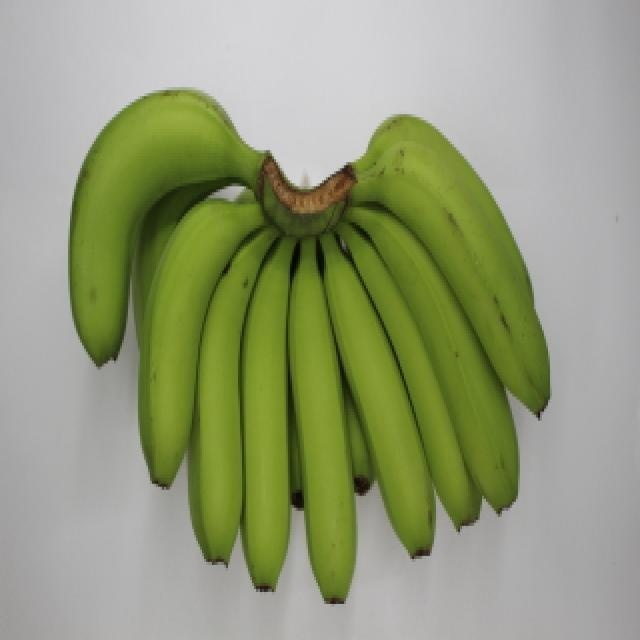

Displaying: /content/darknet/yolov5/runs/detect/exp/146_BAN_153_1_JPG_jpg.rf.03fef25d249eab0142fbc4d3fb1f5a95.jpg




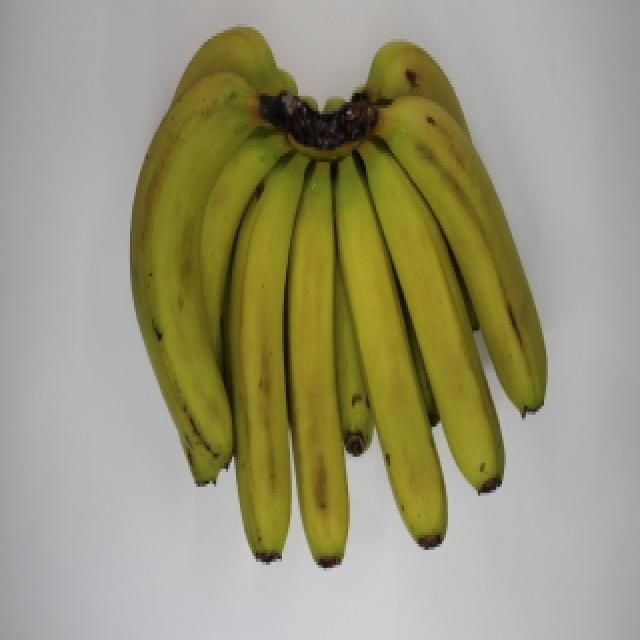

Displaying: /content/darknet/yolov5/runs/detect/exp/226_BAN_234_1_JPG_jpg.rf.78775d6feb15d689a05a2540053e4fbe.jpg




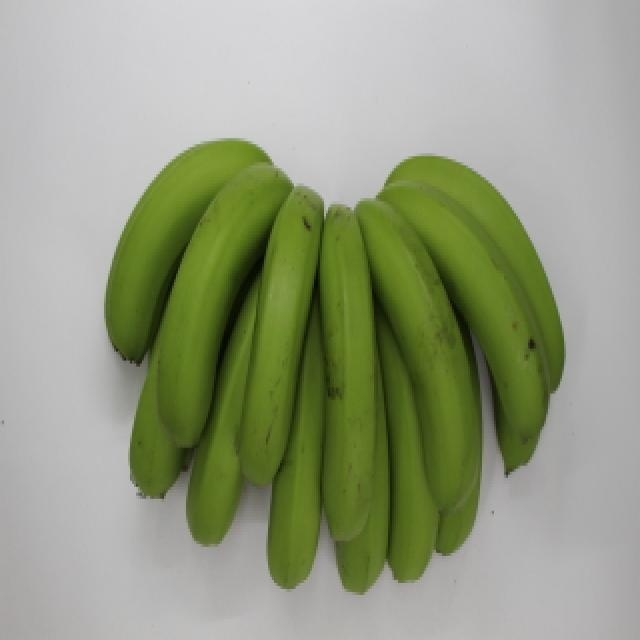

Displaying: /content/darknet/yolov5/runs/detect/exp/398_BAN_144_2_JPG_jpg.rf.b8b8ec8d9c6c0ae0d0f94e5a737d4479.jpg




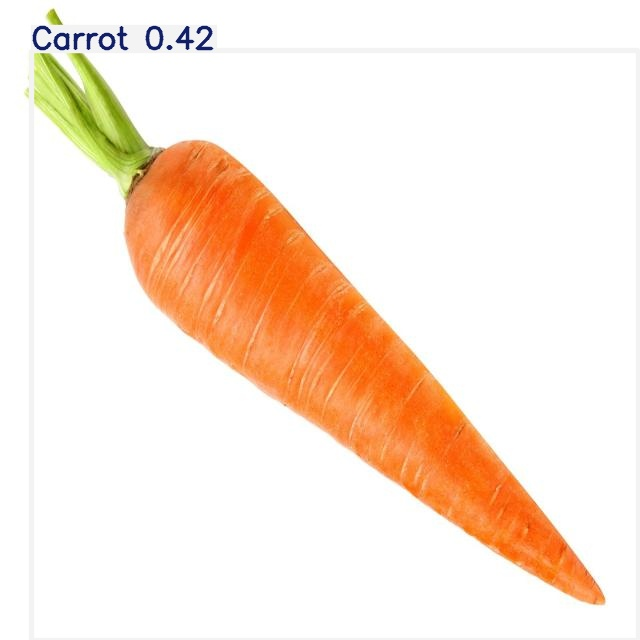

Displaying: /content/darknet/yolov5/runs/detect/exp/Image_2_jpg.rf.a3d9c00eec6a9238d10163fbc7a89b5b.jpg




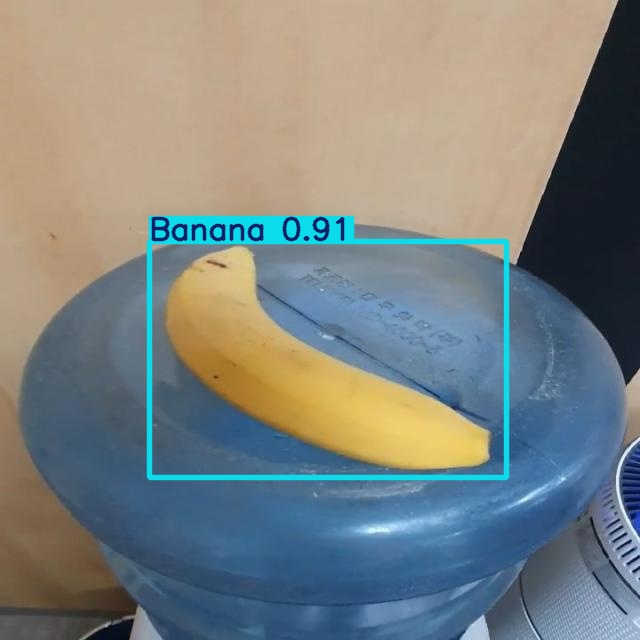

Displaying: /content/darknet/yolov5/runs/detect/exp/-3_mp4-54_jpg.rf.39e4510f627667271c4fea727e652bf3.jpg




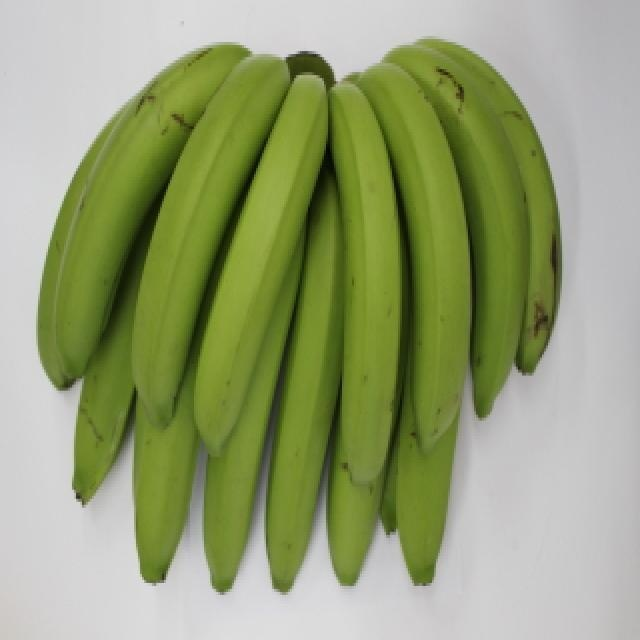

Displaying: /content/darknet/yolov5/runs/detect/exp/283_BAN_027_2_JPG_jpg.rf.56913cc8e03e8aaebb3bde60ae492b05.jpg




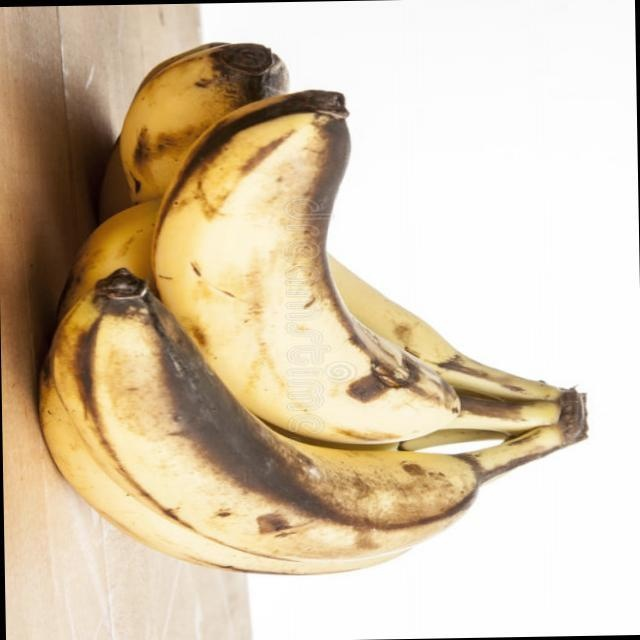

Displaying: /content/darknet/yolov5/runs/detect/exp/33_jpg.rf.240f0557a73af8810b96ce004db03c9c.jpg




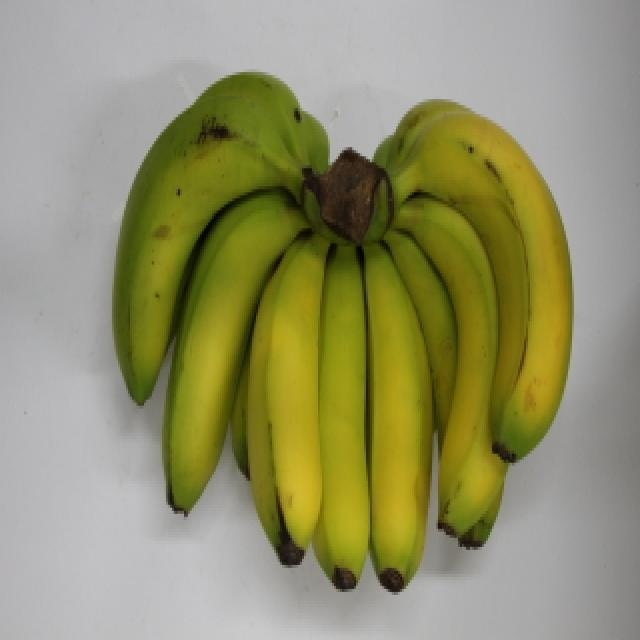

Displaying: /content/darknet/yolov5/runs/detect/exp/013_BAN_015_1_JPG_jpg.rf.5ae227be08ebeef43434c85abf3f9c31.jpg




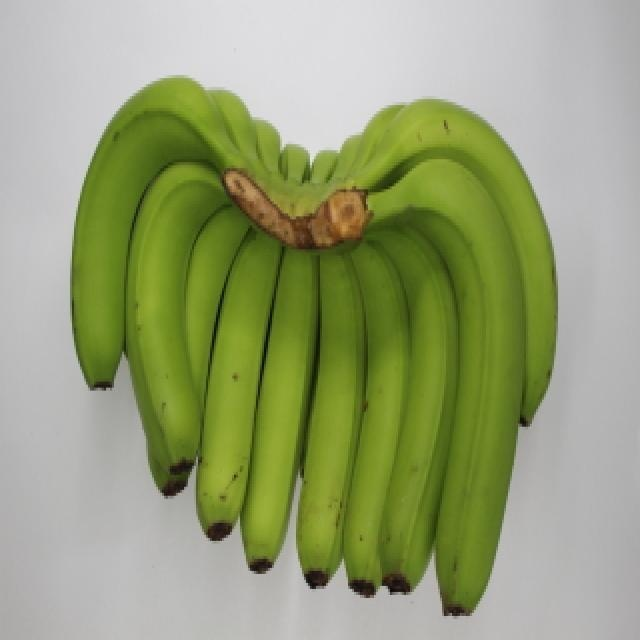

Displaying: /content/darknet/yolov5/runs/detect/exp/141_BAN_148_1_JPG_jpg.rf.3d3ede2fc9bf74faf4d5beda99b0f794.jpg




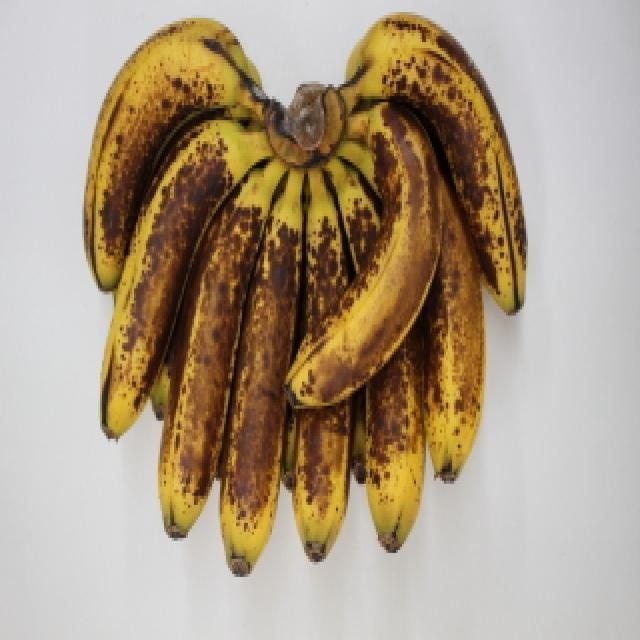

Displaying: /content/darknet/yolov5/runs/detect/exp/053_BAN_056_1_JPG_jpg.rf.9d016d7443de972a84e6f977586c4b00.jpg




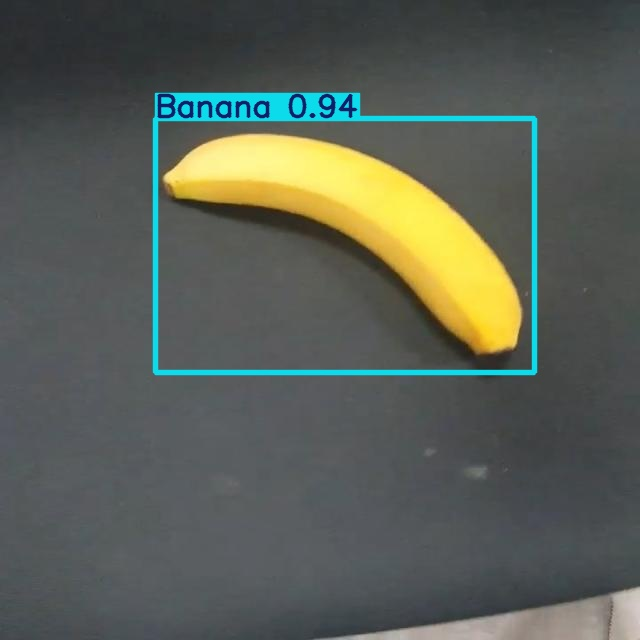

Displaying: /content/darknet/yolov5/runs/detect/exp/-4_mp4-54_jpg.rf.c6914b01752287a066de49c886307ea3.jpg




In [ ]:
import glob  # glob modülünü içe aktarın
from IPython.display import Image, display

# Dosyaların bulunduğu klasörü kontrol edin
image_files = glob.glob('/content/darknet/yolov5/runs/detect/exp/*.jpg')

# Eğer dosyalar varsa, bunları ekranda gösterelim
i = 0
for imageName in image_files:
    i += 1
    if i < 12:  # İlk 12 dosyayı göster
        display(Image(filename=imageName))  # Görüntüyü ekrana getir
        print(f"Displaying: {imageName}")  # Görüntü dosyasının adını yazdır
        print("\n")

In [ ]:
import os

file_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME.jpg'

if os.path.exists(file_path):
    print(f"{file_path} dosyası mevcut!")
else:
    print(f"{file_path} dosyası bulunamadı.")

/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME.jpg dosyası bulunamadı.


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-1-25 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


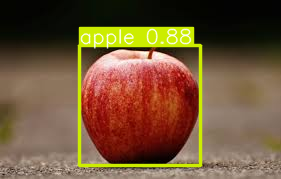

image 1/1: 179x281 1 apple
Speed: 2.9ms pre-process, 57.9ms inference, 553.1ms NMS per image at shape (1, 3, 416, 640)


In [ ]:
import torch
from PIL import Image
from IPython.display import display

# YOLOv5 modelini yükleyin (Örnek olarak YOLOv5'in resmi PyTorch modelini kullanalım)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # 'yolov5s' küçük model, farklı modeller de kullanılabilir

# Görüntüyü yükleyin
img_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME.jpg'
img = Image.open(img_path)

# Modelle nesne algılama yapın
results = model(img)

# Algılanan nesneleri görselleştir
results.show()

# Ayrıca, algılama sonucunda nesnelerin isimlerini ve güven skoru ile birlikte listelemek isterseniz:
results.print()  # Algılanan nesneleri konsola yazdırır

In [ ]:
import os

file_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME1.jpg'

if os.path.exists(file_path):
    print(f"{file_path} dosyası mevcut!")
else:
    print(f"{file_path} dosyası bulunamadı.")

/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME1.jpg dosyası mevcut!


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-1-25 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


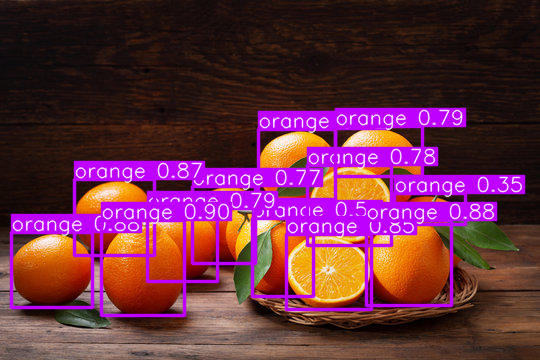

image 1/1: 360x540 12 oranges
Speed: 9.7ms pre-process, 52.8ms inference, 3.6ms NMS per image at shape (1, 3, 448, 640)


In [ ]:
import torch
from PIL import Image
from IPython.display import display

# YOLOv5 modelini yükleyin (Örnek olarak YOLOv5'in resmi PyTorch modelini kullanalım)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # 'yolov5s' küçük model, farklı modeller de kullanılabilir

# Görüntüyü yükleyin
img_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME1.jpg'
img = Image.open(img_path)

# Modelle nesne algılama yapın
results = model(img)

# Algılanan nesneleri görselleştir
results.show()

# Ayrıca, algılama sonucunda nesnelerin isimlerini ve güven skoru ile birlikte listelemek isterseniz:
results.print()  # Algılanan nesneleri konsola yazdırır

In [ ]:
import os

file_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME2.jpg'

if os.path.exists(file_path):
    print(f"{file_path} dosyası mevcut!")
else:
    print(f"{file_path} dosyası bulunamadı.")

/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME2.jpg dosyası mevcut!


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-1-25 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


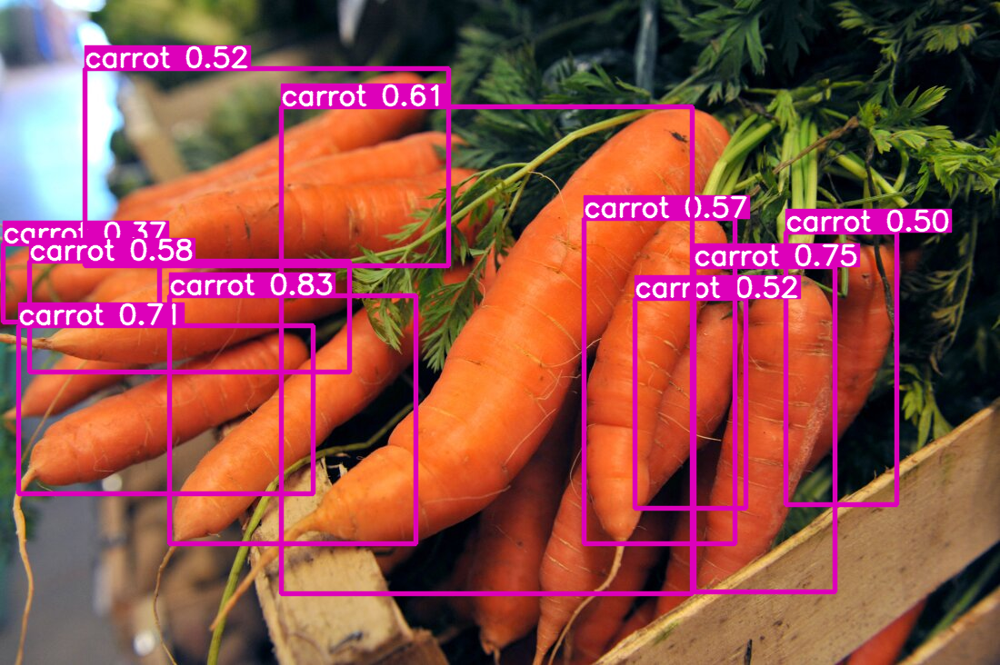

image 1/1: 732x1100 10 carrots
Speed: 8.7ms pre-process, 7.2ms inference, 4.8ms NMS per image at shape (1, 3, 448, 640)


In [ ]:
import torch
from PIL import Image
from IPython.display import display

# YOLOv5 modelini yükleyin (Örnek olarak YOLOv5'in resmi PyTorch modelini kullanalım)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # 'yolov5s' küçük model, farklı modeller de kullanılabilir

# Görüntüyü yükleyin
img_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME2.jpg'
img = Image.open(img_path)

# Modelle nesne algılama yapın
results = model(img)

# Algılanan nesneleri görselleştir
results.show()

# Ayrıca, algılama sonucunda nesnelerin isimlerini ve güven skoru ile birlikte listelemek isterseniz:
results.print()  # Algılanan nesneleri konsola yazdırır

In [ ]:
import os

file_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME3.jpg'

if os.path.exists(file_path):
    print(f"{file_path} dosyası mevcut!")
else:
    print(f"{file_path} dosyası bulunamadı.")

/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME3.jpg dosyası mevcut!


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-1-25 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


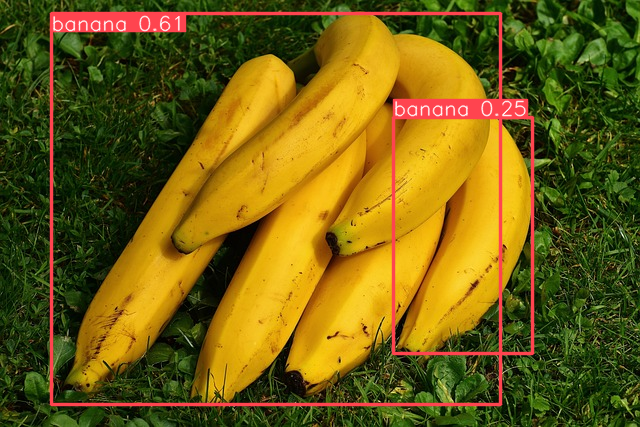

image 1/1: 427x640 2 bananas
Speed: 4.9ms pre-process, 7.9ms inference, 3.4ms NMS per image at shape (1, 3, 448, 640)


In [ ]:
import torch
from PIL import Image
from IPython.display import display

# YOLOv5 modelini yükleyin (Örnek olarak YOLOv5'in resmi PyTorch modelini kullanalım)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # 'yolov5s' küçük model, farklı modeller de kullanılabilir

# Görüntüyü yükleyin
img_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME3.jpg'
img = Image.open(img_path)

# Modelle nesne algılama yapın
results = model(img)

# Algılanan nesneleri görselleştir
results.show()

# Ayrıca, algılama sonucunda nesnelerin isimlerini ve güven skoru ile birlikte listelemek isterseniz:
results.print()  # Algılanan nesneleri konsola yazdırır

In [ ]:
import os

file_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME4.jpg'

if os.path.exists(file_path):
    print(f"{file_path} dosyası mevcut!")
else:
    print(f"{file_path} dosyası bulunamadı.")

/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME4.jpg dosyası mevcut!


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-1-25 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


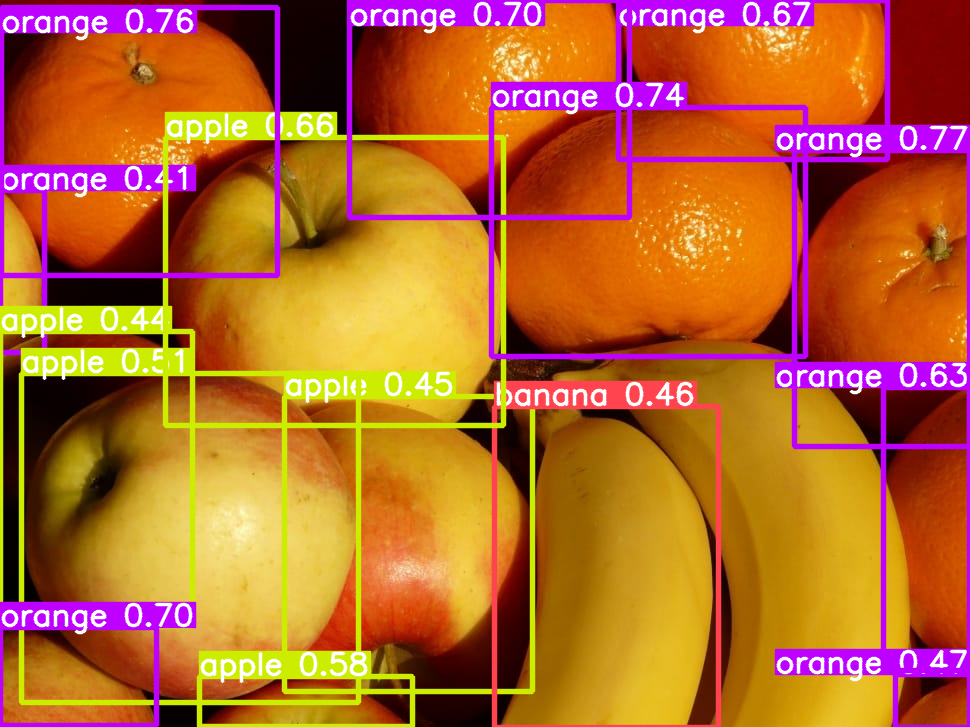

image 1/1: 727x970 1 banana, 5 apples, 9 oranges
Speed: 9.6ms pre-process, 36.2ms inference, 1.9ms NMS per image at shape (1, 3, 480, 640)


In [ ]:
import torch
from PIL import Image
from IPython.display import display

# YOLOv5 modelini yükleyin (Örnek olarak YOLOv5'in resmi PyTorch modelini kullanalım)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # 'yolov5s' küçük model, farklı modeller de kullanılabilir

# Görüntüyü yükleyin
img_path = '/content/darknet/yolov5/FRUIT-AND-VEGETABLE-RECOGNITION-1/valid/images/DENEME4.jpg'
img = Image.open(img_path)

# Modelle nesne algılama yapın
results = model(img)

# Algılanan nesneleri görselleştir
results.show()

# Ayrıca, algılama sonucunda nesnelerin isimlerini ve güven skoru ile birlikte listelemek isterseniz:
results.print()  # Algılanan nesneleri konsola yazdırır